# Vineyard Layout Optimization — Review Notebook

Quick walkthrough of the pipeline, runs the SGD layout optimizer on the
Vineyard farm, then refines the cable network with an exact MILP solver as a warm-start step,
and shows AEP/LCOE convergence.

Everything here calls straight into `Optimize_farm.py`, `Warm_Start_Cables.py` and
`Plot_Convergence.py` -- this notebook isnt a separate implementation, its just a runnable
walkthrough of the same code.


**erun the cell right below first** -- it checks/installs everything this notebook needs, so it
should work even on a machine that never ran this pipeline before.

In [3]:

# ENVIRONMENT CHECK -- run this first. Installs/upgrades this kernel's
# environment to the exact package versions this notebook was tested with.
# ===============================
import importlib.metadata 
import subprocess
import sys

REQUIRED = {
    "numpy": "2.3.2", "scipy": "1.17.1", "matplotlib": "3.10.6", "xarray": "2025.1.0",
    "shapely": "2.1.2", "pyproj": "3.7.0", "openmdao": "3.40.0", "windIO": "2.1.1",
    "py_wake": "2.6.20", "optiwindnet": "0.3.0", "ortools": "9.15.6755",
    "h5py": "3.16.0", "netCDF4": "1.7.4", "openturns": "1.27.post1", "scikit-learn": "1.9.0",
}

def installed(pkg):
    try:
        return importlib.metadata.version(pkg)
    except importlib.metadata.PackageNotFoundError:
        return None

mismatched = {p: v for p, v in REQUIRED.items() if installed(p) != v}

if mismatched:
    print(f"Installing {len(mismatched)} package(s) to the versions this notebook was tested with...")
    for pkg, version in mismatched.items():
        print(f"  {pkg}=={version} ...")
        result = subprocess.run([sys.executable, '-m', 'pip', 'install', '-q', f'{pkg}=={version}'],
                                 capture_output=True, text=True)
        if result.returncode != 0:
            print(result.stdout[-2000:])
            print(result.stderr[-2000:])
            raise RuntimeError(
                f"Could not install '{pkg}=={version}' automatically. Install it manually in this "
                f"kernel's environment (`{sys.executable} -m pip install {pkg}=={version}`) and re-run "
                f"this cell.")
    importlib.metadata.invalidate_caches()

print("Environment OK -- all versions match what this notebook was tested with.")

Environment OK -- all versions match what this notebook was tested with.


In [4]:

import numpy as np
import openmdao.api as om
from pathlib import Path
import pickle
import windIO
import matplotlib.pyplot as plt
from IPython.display import Image, display

from Components.foundations import mean_wind_speed
from Components.plotting import FarmPlotter
from Optimize_farm import build_farm_model, opt_competitive
from Warm_Start_Cables import warm_start_cable_routing, default_milp_router
from Plot_Convergence import plot_convergence
from optiwindnet.api import MILPRouter, ModelOptions


NOTEBOOK_OUTPUT_DIR = "Results_Notebook_Review"
Path(NOTEBOOK_OUTPUT_DIR).mkdir(parents=True, exist_ok=True)

FARM_NAME = "vineyard"
DATA_DIR = Path("Data")

/opt/anaconda3/envs/wesl_jul_31/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## 1. What we're accounting for

Before building anything, here's the raw assumptions the model runs on: turbine specs, cable
catalogue, financial parameters. If these are wrong everything downstream is wrong too, so
worth eyeballing before we go any further.

In [5]:
SYSTEM_YAML = DATA_DIR / "vineyard_revolution_system.yaml"
SITE_YAML = DATA_DIR / "site_us.yaml"
BATHY_NC = DATA_DIR / "bathymetry_us.nc"

system_dat = windIO.load_yaml(SYSTEM_YAML)
site_dat = windIO.load_yaml(SITE_YAML)

wind_resource = system_dat['site']['energy_resource']['wind_resource']
site_resource_dict = {
    'directions': np.array(wind_resource['wind_direction']),
    'probabilities': np.array(wind_resource['sector_probability']['data']),
    'weibull_A': np.array(wind_resource['weibull_a']['data']),
    'weibull_k': np.array(wind_resource['weibull_k']['data']),
    'ws_TI': np.array(wind_resource['wind_speed']),
    'TI_org': wind_resource['turbulence_intensity']['data'],
}
site_resource_dict['probabilities'] /= site_resource_dict['probabilities'].sum()

# NOTE: Vineyard and Revolution carry different turbines (Haliade-X 13MW vs SG11-200
# 11MW) -- foundation params below are looked up per farm in build_registry(), not shared.

rd_turbine = float(system_dat['wind_farm'][0]['turbines']['rotor_diameter'])
hub_height = float(system_dat['wind_farm'][0]['turbines']['hub_height'])
wind_speed_design = mean_wind_speed(site_resource_dict)

# RP=13 (Vineyard/Haliade-X) and RP=11 (Revolution/SG11-200), trained from real IEA
# Wind 2200-22-ROWP structural data -- see Data/ssms/train_project_turbines.py
FOUNDATION_PARAMS = {
    'vineyard': {'rated_power': 13, 'ip_platform': 15.0},
    'revolution': {'rated_power': 11, 'ip_platform': 10.0},
}

cable_specs = np.array([(3, 368.9), (5, 428.9), (7, 737.1)],
                        dtype=[('capacity', int), ('cost', float)])

print(f"Vineyard turbine: {rd_turbine:.0f} m rotor, {hub_height:.0f} m hub height")
print(f"Cable catalogue (capacity, EUR/m): {list(cable_specs)}")
print(f"Discount rate / lifetime / fixed CAPEX / annual OPEX -> see LCOEComp defaults in Components/lcoe_comp.py")

Vineyard turbine: 220 m rotor, 150 m hub height
Cable catalogue (capacity, EUR/m): [np.void((3, 368.9), dtype=[('capacity', '<i8'), ('cost', '<f8')]), np.void((5, 428.9), dtype=[('capacity', '<i8'), ('cost', '<f8')]), np.void((7, 737.1), dtype=[('capacity', '<i8'), ('cost', '<f8')])]
Discount rate / lifetime / fixed CAPEX / annual OPEX -> see LCOEComp defaults in Components/lcoe_comp.py


In [6]:

fig, ax = plt.subplots(figsize=(5, 3.5))
ax.bar([str(int(c)) for c in cable_specs['capacity']], cable_specs['cost'], color='#d97b29')
ax.set_xlabel("Cable capacity (turbines fed)")
ax.set_ylabel("Cost (EUR / m)")
ax.set_title("Cable catalogue")
ax.grid(True, axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

/var/folders/1j/_3qt8y3s02n_m1mtt8pcvnh00000gr/T/ipykernel_3712/279720123.py:8: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [7]:

def build_registry():
    registry = {}
    for idx, farm_name in enumerate(["vineyard", "revolution"]):
        farm_node = system_dat['wind_farm'][idx]
        turbine_node = farm_node['turbines']
        layout_node = farm_node['layouts'][0]['coordinates']
        x_init = np.array(layout_node['x'], dtype=float)
        y_init = np.array(layout_node['y'], dtype=float)
        sub_node = farm_node['electrical_substations'][0]['electrical_substation']['coordinates']
        substation_coord = np.array([[float(sub_node['x'][0]), float(sub_node['y'][0])]], dtype=float)
        poly_node = site_dat['boundaries']['polygons'][idx]
        boundary_vertices = np.column_stack((poly_node['x'], poly_node['y']))
        registry[farm_name] = {
            'site_yaml': site_resource_dict, 'system_yaml': system_dat, 'bathy_nc': BATHY_NC,
            'rated_power': FOUNDATION_PARAMS[farm_name]['rated_power'],
            'ip_platform': FOUNDATION_PARAMS[farm_name]['ip_platform'],
            'rotor_diameter': float(turbine_node['rotor_diameter']),
            'hub_height': float(turbine_node['hub_height']),
            'wind_speed': wind_speed_design,
            'boundary_vertices': boundary_vertices,
            'substation_coord': substation_coord, 'cable_specs': cable_specs,
            'x_init': x_init.copy(), 'y_init': y_init.copy(), 'min_spacing': 4.0 * rd_turbine,
            'farm_index': idx,  # AEPComp needs this to pick its own turbine (see aep.py)
        }
    return registry

farm_data_registry = build_registry()
cfg = farm_data_registry[FARM_NAME]
n_wt = len(cfg['x_init'])
print(f"{FARM_NAME}: {n_wt} turbines, min spacing {cfg['min_spacing']:.0f} m")

# Revolution's turbines get injected as static neighbors below (Vineyard doesn't optimize
# in isolation -- Revolution's wake shadow onto Vineyard does matter). Tagged with their
# own farm_index so AEPComp casts their wake using Revolution's actual turbine (SG11-200
# 11MW), not Vineyard's -- see farm_index/neighbor_farm_idx plumbing in aep.py.
neighbor_x = np.concatenate([farm_data_registry[f]['x_init'] for f in farm_data_registry if f != FARM_NAME])
neighbor_y = np.concatenate([farm_data_registry[f]['y_init'] for f in farm_data_registry if f != FARM_NAME])
neighbor_farm_idx = np.concatenate([
    np.full(len(farm_data_registry[f]['x_init']), farm_data_registry[f]['farm_index'], dtype=int)
    for f in farm_data_registry if f != FARM_NAME
])
print(f"{len(neighbor_x)} neighbor turbines injected (from other registered farms)")

vineyard: 63 turbines, min spacing 880 m
80 neighbor turbines injected (from other registered farms)


## 2. Building the model

`build_farm_model()` wires up the OpenMDAO group -- same function `Optimize_farm.py` uses.
Quick rundown of what's in there:

- `aep_comp` -- PyWake wake model, gives AEP for a given layout. Uses `farm_index` to pick
  Vineyard's own turbine, and casts Revolution's neighbor wake using Revolution's own turbine
  (via `neighbor_farm_idx`) -- important since the two farms use different turbines now
- `cable_comp` -- OptiWindNet, routes + costs the cable network
- `foundations_comp` -- monopile mass/cost from bathymetry depth at each turbine
- `lcoe_comp` -- combines AEP + cable cost + foundation cost into LCOE
- `boundary_comp` / `spacing_comp` -- constraint values (distance to boundary, inter-turbine spacing)

In [8]:
prob = om.Problem()
prob.model = build_farm_model(
    farm_name=FARM_NAME,
    n_wt=n_wt,
    site_yaml_path=cfg['site_yaml'],
    system_yaml_path=cfg['system_yaml'],
    bathy_nc_path=cfg['bathy_nc'],
    rated_power=cfg['rated_power'],
    ip_platform=cfg['ip_platform'],
    rotor_diameter=cfg['rotor_diameter'],
    hub_height=cfg['hub_height'],
    wind_speed=cfg['wind_speed'],
    neighbor_x=neighbor_x,
    neighbor_y=neighbor_y,
    boundary_vertices=cfg['boundary_vertices'],
    substation_coord=cfg['substation_coord'],
    cable_specs=cfg['cable_specs'],
    min_spacing=cfg['min_spacing'],
    unconstrained_mode=True,   
    stochastic_mode=False,     
    farm_index=cfg['farm_index'],
    neighbor_farm_idx=neighbor_farm_idx,
)
prob.setup()
prob.set_val('turbine_x', cfg['x_init'])
prob.set_val('turbine_y', cfg['y_init'])
print("model built + setup OK")

model built + setup OK


WRN - QuadraticLeastSquares.getMetaModel is deprecated


## 3. Sanity check 

In [9]:
prob.run_model()

cable_cost_0 = float(prob.get_val('cost_cables')[0])
foundation_cost_0 = np.asarray(prob.get_val('cost_foundations'))
aep_0 = float(prob.get_val('aep', units='MW*h')[0])

print(f"AEP (initial layout):        {aep_0:,.0f} MWh")
print(f"Cable CAPEX (initial):       {cable_cost_0:,.0f} EUR")
print(f"Foundation CAPEX (initial):  {foundation_cost_0.sum():,.0f} EUR  (range {foundation_cost_0.min():,.0f} - {foundation_cost_0.max():,.0f} per turbine)")

fig, axes = plt.subplots(1, 2, figsize=(10, 3.5))
axes[0].bar(['Cable CAPEX', 'Foundation CAPEX'], [cable_cost_0, foundation_cost_0.sum()], color=['#d97b29', '#1f4e8c'])
axes[0].set_ylabel("EUR")
axes[0].set_title("Initial CAPEX breakdown")
axes[0].grid(True, axis='y', linestyle='--', alpha=0.4)

axes[1].hist(foundation_cost_0, bins=15, color='#1f4e8c', alpha=0.8)
axes[1].set_xlabel("Foundation cost per turbine (EUR)")
axes[1].set_ylabel("count")
axes[1].set_title("spread (depth-driven)")
plt.tight_layout()
plt.show()

/opt/anaconda3/envs/wesl_jul_31/lib/python3.11/site-packages/openmdao/core/group.py:3165: UnitsWarning:<model> <class Group>: Output '_auto_ivc.v0' with units of 'm' is connected to input 'cable_comp.turbine_x' which has no units.
/opt/anaconda3/envs/wesl_jul_31/lib/python3.11/site-packages/openmdao/core/group.py:3165: UnitsWarning:<model> <class Group>: Output '_auto_ivc.v1' with units of 'm' is connected to input 'cable_comp.turbine_y' which has no units.


AEP (initial layout):        3,595,512 MWh
Cable CAPEX (initial):       79,035,596 EUR
Foundation CAPEX (initial):  401,075,781 EUR  (range 5,944,907 - 6,993,387 per turbine)


/var/folders/1j/_3qt8y3s02n_m1mtt8pcvnh00000gr/T/ipykernel_3712/3513050489.py:22: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


## 4. Starting layout (before anything moves)

this is the x_init / y_init straight from the windIO yaml -- literally where the optimizer
warm starts from, no optimization applied yet.

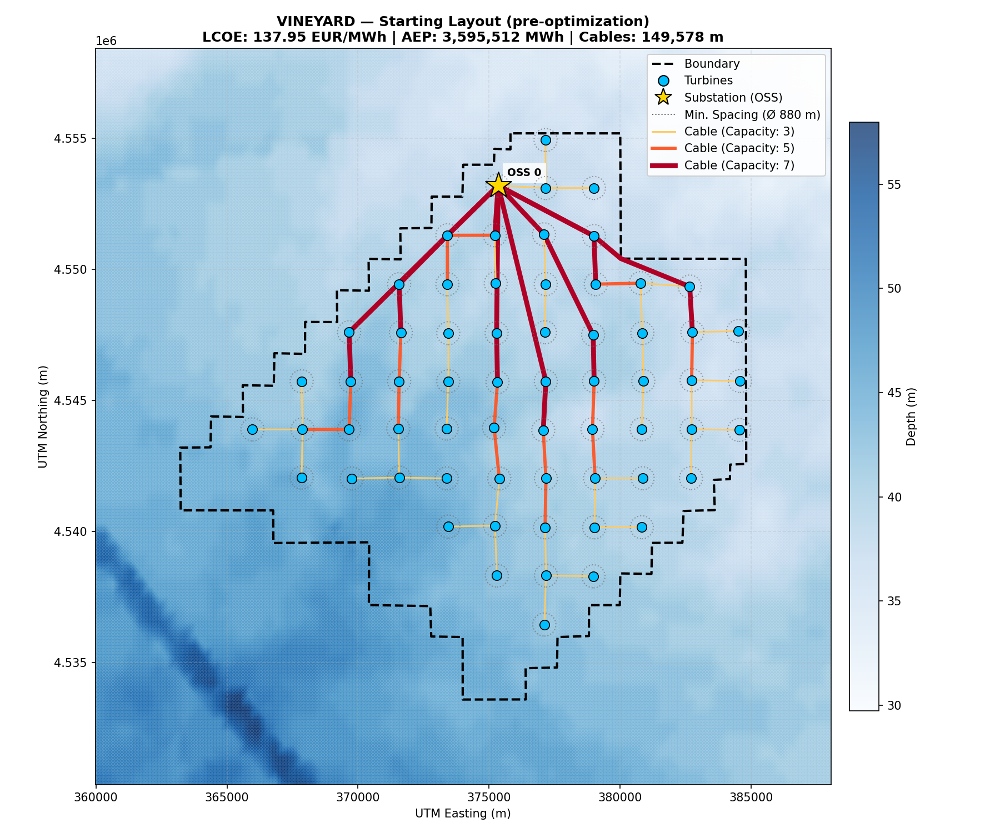

In [10]:
plotter_preview = FarmPlotter(
    farm_name=FARM_NAME,
    boundary_vertices=cfg['boundary_vertices'],
    substation_coord=cfg['substation_coord'],
    cable_specs=cfg['cable_specs'],
    bathy_nc_path=cfg['bathy_nc'],
    output_dir=Path(NOTEBOOK_OUTPUT_DIR) / "plots" / FARM_NAME,
    min_spacing=cfg['min_spacing'],
)
initial_plot_path = plotter_preview.save_iteration_plot(
    cycle=1, iteration=0,
    turbine_x=cfg['x_init'], turbine_y=cfg['y_init'],
    wfn=getattr(prob.model.cable_comp, 'wfn', None),
    lcoe=float(prob.get_val('lcoe')[0]), aep=aep_0,
    tag='notebook_start', label='Starting Layout (pre-optimization)',
)
display(Image(filename=str(initial_plot_path)))

## 5. Running the optimization -- edit here

This is the actual optimization call, `opt_competitive()` from `Optimize_farm.py`. It handles
the Nash loop / plotting / convergence logging for us, so no need to rebuild the Problem again
by hand like above.

**Params below the `# EDIT` line are safe to change and re-run this cell:**

- `MAX_ITER` -- more iterations = better convergence, slower. Kept low here for review speed
  (the "real" run in `Optimize_farm.py`'s `__main__` uses 100)
- `SAMPLE_SIZE` -- bigger = less noisy stochastic gradient per step, slower per iteration
- `OBJECTIVE` -- `'lcoe'` (default) or `'aep'` if you want to see pure AEP maximization instead
- `TOL` -- Nash equilibrium tolerance in meters, only matters with >1 farm in `farm_sequence`

Everything else (learning rate, beta1/beta2, penalty schedule) lives inside the `SGD` driver
in `Components/Drivers.py` -- wouldn't touch those without a reason.

In [11]:
# ============================================================
# EDIT THESE
# ============================================================
MAX_ITER = 100
SAMPLE_SIZE = 100
OBJECTIVE = 'lcoe'          # 'lcoe' or 'aep'
TOL = 2.0
# ============================================================

farm_data_registry = build_registry()  # fresh copy, see note in the function above

opt_competitive(
    farm_sequence=[FARM_NAME],
    max_cycles=1,
    farm_data_registry=farm_data_registry,
    optimizer='SGD',
    stochastic_mode=True,
    sample_size=SAMPLE_SIZE,
    max_iter=MAX_ITER,
    tol=TOL,
    output_dir=NOTEBOOK_OUTPUT_DIR,
    save_plots=True,
    plot_every=5,           # only snapshot every 5th iteration, keeps the folder from filling up
    log_convergence=True,
    log_every=1,            # log every iteration though, want a smooth curve
    objective=OBJECTIVE,
)

=== INITIALIZING COMPETITIVE LAYOUT OPTIMIZATION ===
Active Sequence: ['vineyard']
Unconstrained Aggregation Mode: True


   STARTING GLOBAL NASH CYCLE 1 / 1

--- Optimizing Active Asset: VINEYARD ---
Injecting 80 static neighbor turbines into PyWake environment.


/opt/anaconda3/envs/wesl_jul_31/lib/python3.11/site-packages/openmdao/core/group.py:3165: UnitsWarning:<model> <class Group>: Output '_auto_ivc.v0' with units of 'm' is connected to input 'cable_comp.turbine_x' which has no units.
/opt/anaconda3/envs/wesl_jul_31/lib/python3.11/site-packages/openmdao/core/group.py:3165: UnitsWarning:<model> <class Group>: Output '_auto_ivc.v1' with units of 'm' is connected to input 'cable_comp.turbine_y' which has no units.


--- UNITS AND SCALE AUDIT ---
Raw cable CAPEX: [79035595.70404597] EUR
Raw foundation CAPEX: [6023891.84029023 5944906.53866391 6128226.98948811 6112793.73696639
 6208232.62505797 6271124.18488669 6051781.09746217 6080759.12045949
 6383592.71351294 6383592.71351294 6160520.31286976 6145637.85096943
 6165909.70986521 6160520.31286976 6030841.85722513 6025015.98473608
 6051781.09746217 6257779.42109605 6271124.18488669 6259612.64579507
 6271124.18488669 6273935.56444952 6405637.89669623 6402597.46623019
 6487264.7602856  6732186.23904768 6531190.05073409 6588848.70115071
 6449055.03207103 6421136.11295859 6313606.21829989 6236894.03053695
 5990592.52352126 6033815.95409392 6076800.29770052 6160520.31286976
 6160520.31286976 6017730.77206549 6195472.05444775 6597342.21286523
 6614123.74059343 6702847.12019557 6930421.70180347 6610096.01189808
 6618388.94948707 6993386.60117116 6973905.20578415 6948673.69733906
 6827265.7606696  6581755.16053472 6344269.5587157  6271124.18488669
 6271124.1

/opt/anaconda3/envs/wesl_jul_31/lib/python3.11/site-packages/openmdao/utils/coloring.py:447: DerivativesWarning:Coloring was deactivated.  Improvement of 0.0% was less than min allowed (5.0%).
/opt/anaconda3/envs/wesl_jul_31/lib/python3.11/site-packages/openmdao/utils/coloring.py:447: DerivativesWarning:Coloring was deactivated.  Improvement of 0.0% was less than min allowed (5.0%).


No coloring was computed successfully.
Adam Iter:   1 | lcoe: 136.3558 | Multiplier (Alpha): 3.71e-05 | |G|inf: 2.1633e-03
Adam Iter:   5 | lcoe: 145.5605 | Multiplier (Alpha): 3.76e-05 | |G|inf: 2.2033e-03
Adam Iter:  10 | lcoe: 128.9384 | Multiplier (Alpha): 3.96e-05 | |G|inf: 1.1918e-03
Adam Iter:  15 | lcoe: 140.5187 | Multiplier (Alpha): 4.32e-05 | |G|inf: 1.2016e-03
Adam Iter:  20 | lcoe: 130.0755 | Multiplier (Alpha): 4.88e-05 | |G|inf: 1.4068e-03
Adam Iter:  25 | lcoe: 141.4211 | Multiplier (Alpha): 5.72e-05 | |G|inf: 1.8176e-03
Adam Iter:  30 | lcoe: 129.0009 | Multiplier (Alpha): 6.94e-05 | |G|inf: 1.3097e-03
Adam Iter:  35 | lcoe: 132.5424 | Multiplier (Alpha): 8.72e-05 | |G|inf: 1.0934e-03
Adam Iter:  40 | lcoe: 124.1768 | Multiplier (Alpha): 1.13e-04 | |G|inf: 9.6973e-04
Adam Iter:  45 | lcoe: 140.0898 | Multiplier (Alpha): 1.53e-04 | |G|inf: 1.4007e-03
Adam Iter:  50 | lcoe: 119.1423 | Multiplier (Alpha): 2.13e-04 | |G|inf: 6.9044e-04
Adam Iter:  55 | lcoe: 129.4409 | Mul

## 6. Optimized layout

Whatever `opt_competitive()` landed on after `MAX_ITER` iterations.

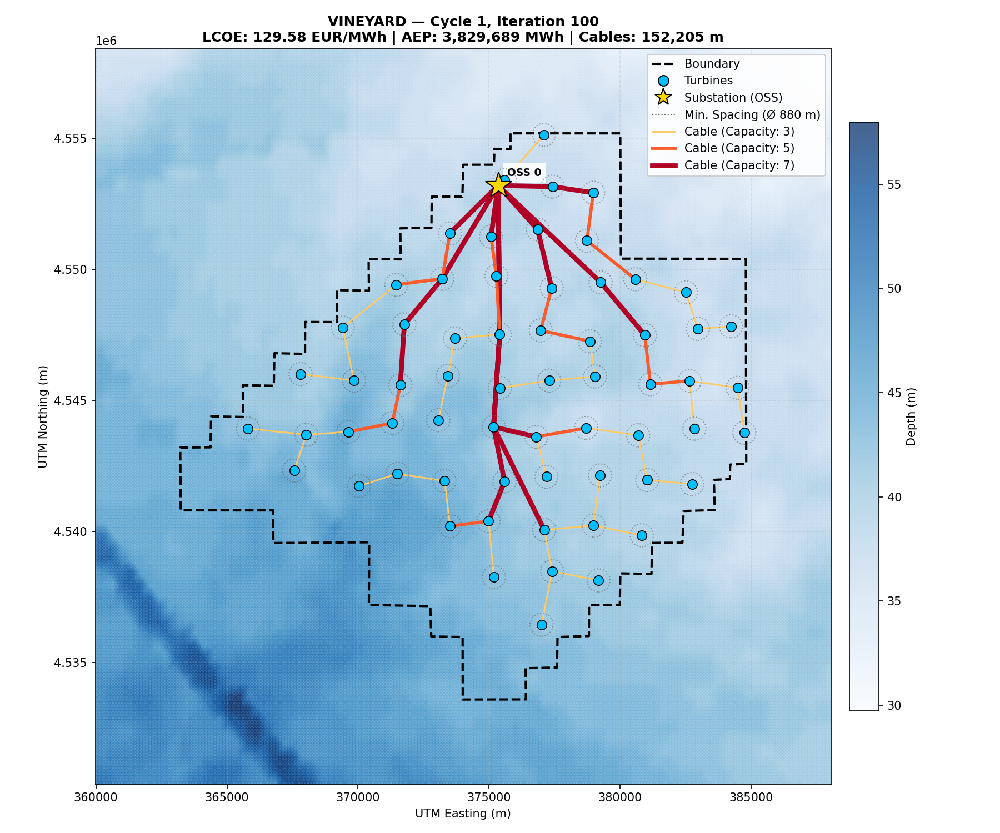

In [13]:
final_plots = sorted((Path(NOTEBOOK_OUTPUT_DIR) / "plots" / FARM_NAME).glob("*_final.png"))
if final_plots:
    display(Image(filename=str(final_plots[-1])))
else:
    print("no '_final' plot found -- did the optimization cell above finish OK?")

## 7. Convergence

AEP / LCOE vs iteration and vs wall-clock time, using the deterministic (full wind-rose)
re-evaluation at each step -- not the noisy stochastic mini-batch sample the driver actually
trains on. See `Plot_Convergence.py` docstring if curious why that distinction matters (short
version: the mini-batch estimate is way too noisy iteration-to-iteration to read a trend off of).

[Exported] Convergence plot saved to: Results_Notebook_Review/convergence_vineyard_cycle_1.png


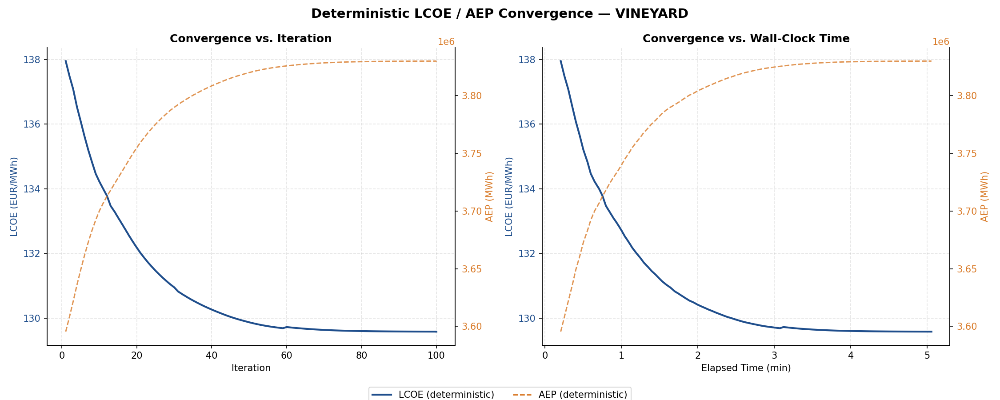

In [14]:
conv_path = Path(NOTEBOOK_OUTPUT_DIR) / f"convergence_{FARM_NAME}_cycle_1.pkl"
conv_plot_path = plot_convergence(conv_path)
display(Image(filename=str(conv_plot_path)))

## 8. Warm start: refining the cable network with MILP

The SGD loop above uses a fast heuristic (EWRouter) for cable routing every single iteration,
since it gets called ~20-100 times and needs to be quick. Once the layout is frozen after
optimization we can afford to spend real time on an exact MILP solver instead, to actually
optimize cable topology rather than just heuristically routing it.

Turbine positions are frozen at this point -- this step only touches the cable network, AEP
carries over unchanged.

Note: shortened the solver time limit to 45s here for the demo (default in
`Warm_Start_Cables.py` is 90s) -- bump it up for a real analysis, MILP quality generally
improves with more time.

In [15]:
demo_router = MILPRouter(
    solver_name='ortools.cp_sat', time_limit=90, mip_gap=0.005,
    model_options=ModelOptions(topology='branched', feeder_limit='minimum', feeder_route='segmented'),
    verbose=False,
)

checkpoint_path = Path(NOTEBOOK_OUTPUT_DIR) / f"checkpoint_{FARM_NAME}_cycle_1.pkl"
milp_result = warm_start_cable_routing(checkpoint_path, router=demo_router)

=== WARM-START CABLE ROUTING: VINEYARD / cycle 1 ===
Router: MILPRouter | Runtime: 90.22 s
vs. EWRouter baseline -> Length: +9,424.34 m | Cost: +6,745,302.35 EUR
Cable cost: 75,569,873.61 EUR | Cable length: 142,781.13 m
LCOE: 129.4347 EUR/MWh (AEP frozen at 3,829,689.04 MWh)
[Exported] Warm-start checkpoint saved to: Results_Notebook_Review/checkpoint_vineyard_cycle_1_milp.pkl
[Exported] Final plot saved to: Results_Notebook_Review/plots/vineyard/vineyard_cycle01_iter0000_milp_final.png


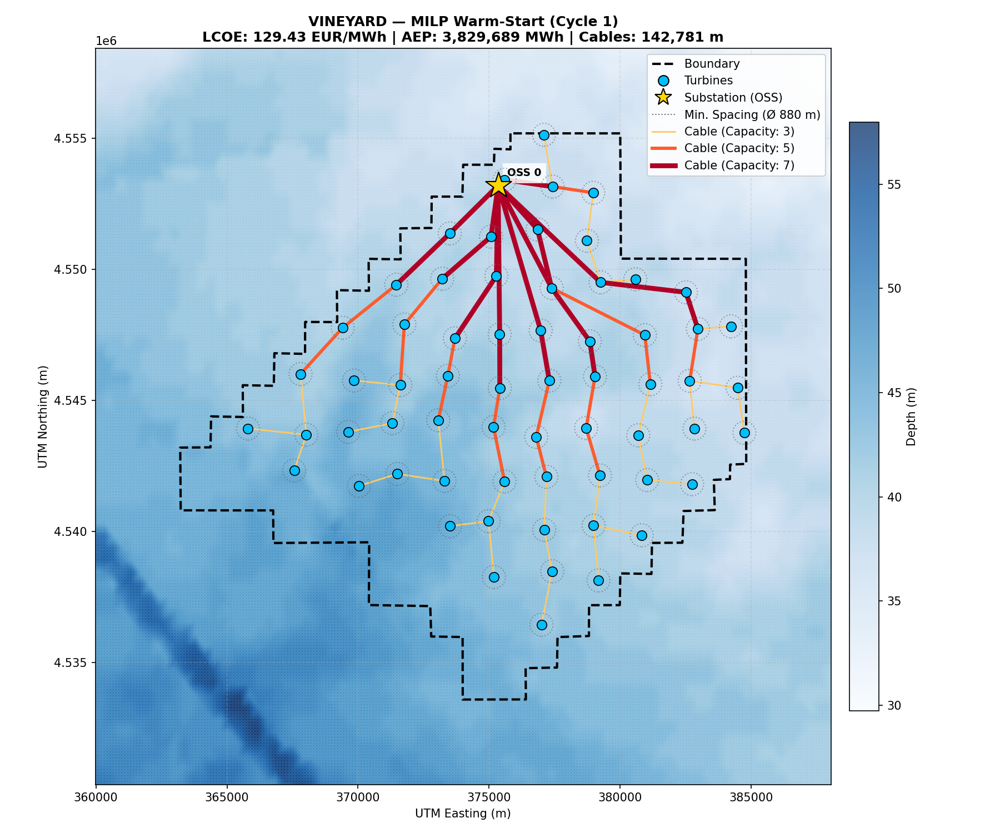

In [16]:
display(Image(filename=milp_result['plot_path']))

## wrap up

quick before/after summary below. Numbers will move around a bit between runs since the driver
is stochastic (different random wind draws each time) -- that's expected, not a bug, see the
convergence plot above for how much noise to expect at this `SAMPLE_SIZE`.

if you want the full-length run (100 iterations, full MILP time budget) just bump `MAX_ITER`
and `time_limit` back up in the cells above and re-run -- everything else stays the same.

In [17]:
with open(checkpoint_path, 'rb') as f:
    final_ckpt = pickle.load(f)

print(f"{'':25s}{'start':>15s}{'after SGD':>18s}{'after MILP':>18s}")
print(f"{'AEP (MWh)':25s}{aep_0:>15,.0f}{final_ckpt['aep_mwh']:>18,.0f}{milp_result['aep_mwh']:>18,.0f}")
print(f"{'LCOE (EUR/MWh)':25s}{float(prob.get_val('lcoe')[0]):>15.2f}{final_ckpt['lcoe_eur_mwh']:>18.2f}{milp_result['lcoe_eur_mwh']:>18.2f}")
print(f"{'Cable cost (EUR)':25s}{cable_cost_0:>15,.0f}{final_ckpt['cost_cables_eur']:>18,.0f}{milp_result['cost_cables_eur']:>18,.0f}")
print(f"{'Cable length (m)':25s}{'--':>15s}{final_ckpt['cable_network']['length_m']:>18,.0f}{milp_result['cable_network']['length_m']:>18,.0f}")

                                   start         after SGD        after MILP
AEP (MWh)                      3,595,512         3,829,689         3,829,689
LCOE (EUR/MWh)                    137.95            129.58            129.43
Cable cost (EUR)              79,035,596        82,315,176        75,569,874
Cable length (m)                      --           152,205           142,781


/opt/anaconda3/envs/wesl_jul_31/lib/python3.11/site-packages/openmdao/core/group.py:3165: UnitsWarning:<model> <class Group>: Output '_auto_ivc.v0' with units of 'm' is connected to input 'cable_comp.turbine_x' which has no units.
/opt/anaconda3/envs/wesl_jul_31/lib/python3.11/site-packages/openmdao/core/group.py:3165: UnitsWarning:<model> <class Group>: Output '_auto_ivc.v1' with units of 'm' is connected to input 'cable_comp.turbine_y' which has no units.


Table 3 scenario (Vineyard 13MW, Reference's exact CapEx/OpEx rate):
  AEP:  3,595,512 MWh
  LCOE: 116.12 EUR/MWh


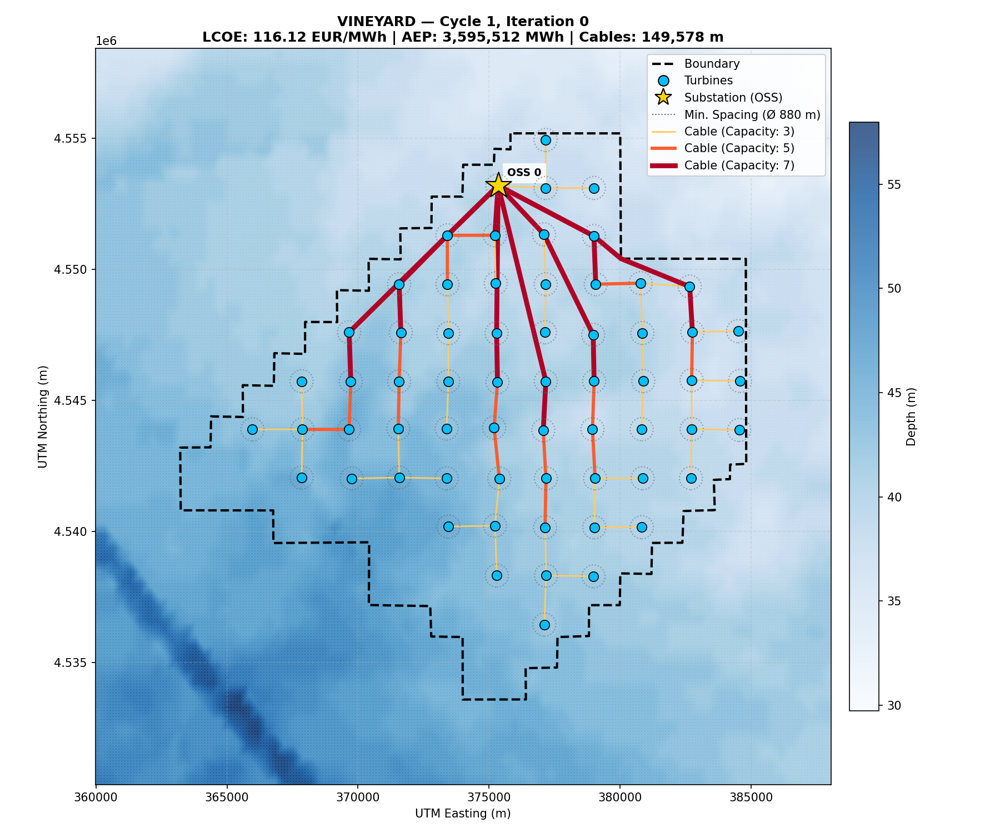

In [18]:
prob_table3 = om.Problem()
prob_table3.model = build_farm_model(
    farm_name=FARM_NAME,
    n_wt=n_wt,
    site_yaml_path=cfg['site_yaml'],
    system_yaml_path=cfg['system_yaml'],
    bathy_nc_path=cfg['bathy_nc'],
    rated_power=cfg['rated_power'],
    ip_platform=cfg['ip_platform'],
    rotor_diameter=cfg['rotor_diameter'],
    hub_height=cfg['hub_height'],
    wind_speed=cfg['wind_speed'],
    neighbor_x=neighbor_x,
    neighbor_y=neighbor_y,
    boundary_vertices=cfg['boundary_vertices'],
    substation_coord=cfg['substation_coord'],
    cable_specs=cfg['cable_specs'],
    min_spacing=cfg['min_spacing'],
    unconstrained_mode=True,
    stochastic_mode=False,
    farm_index=cfg['farm_index'],
    neighbor_farm_idx=neighbor_farm_idx,
)
prob_table3.setup()
prob_table3.model.lcoe_comp.options['capex_fixed_per_kw'] = 4397.0 * 0.924
prob_table3.model.lcoe_comp.options['opex_annual_per_kw'] = 135.0 * 0.924
prob_table3.set_val('turbine_x', cfg['x_init'])
prob_table3.set_val('turbine_y', cfg['y_init'])
prob_table3.run_model()

aep_table3 = float(prob_table3.get_val('aep', units='MW*h')[0])
lcoe_table3 = float(prob_table3.get_val('lcoe')[0])
print(f"Table 3 scenario (Vineyard 13MW, Reference's exact CapEx/OpEx rate):")
print(f"  AEP:  {aep_table3:,.0f} MWh")
print(f"  LCOE: {lcoe_table3:.2f} EUR/MWh")

plotter_table3 = FarmPlotter(
    farm_name=FARM_NAME,
    boundary_vertices=cfg['boundary_vertices'],
    substation_coord=cfg['substation_coord'],
    cable_specs=cfg['cable_specs'],
    bathy_nc_path=cfg['bathy_nc'],
    output_dir=Path(NOTEBOOK_OUTPUT_DIR) / "plots" / FARM_NAME,
    min_spacing=cfg['min_spacing'],
)
table3_plot_path = plotter_table3.save_iteration_plot(
    cycle=1, iteration=0,
    turbine_x=cfg['x_init'], turbine_y=cfg['y_init'],
    wfn=getattr(prob_table3.model.cable_comp, 'wfn', None),
    lcoe=lcoe_table3, aep=aep_table3,
    tag='table3_ref_rate', label="",
)
display(Image(filename=str(table3_plot_path)))
